In [1]:
#Import Necessary libraries

In [2]:
import numpy as np
import cv2
import matplotlib.pyplot as plt
import matplotlib.image as mpimg
import glob
import os

In [3]:
#read in camer calibration

In [4]:
objpoints =[]
imgpoints =[]
objp = np.zeros((9*6,3),np.float32)
objp[:,:2]=np.mgrid[0:9,0:6].T.reshape(-1,2)
images = glob.glob('camera_cal/calibration*')
calib_img =[]

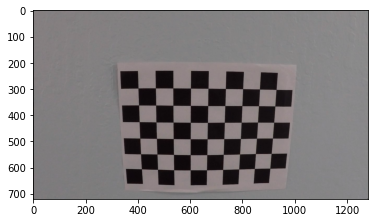

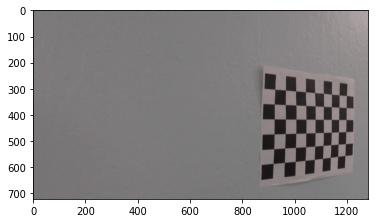

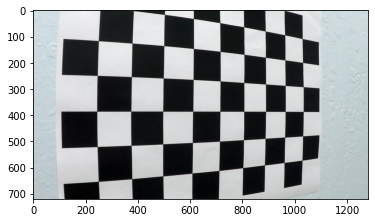

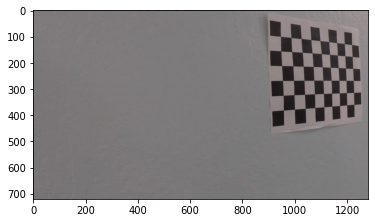

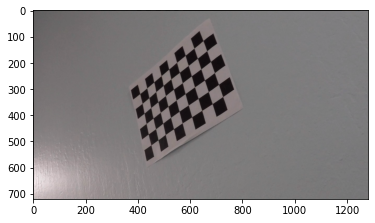

...

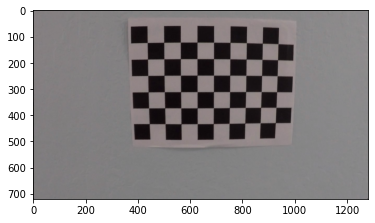

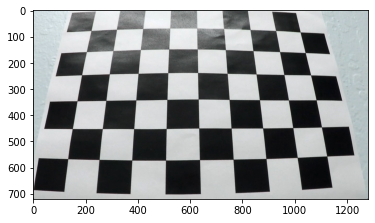

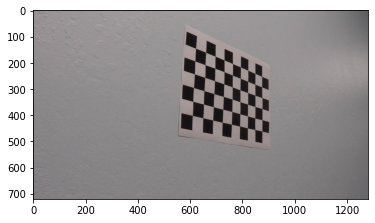

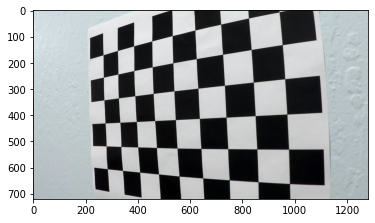

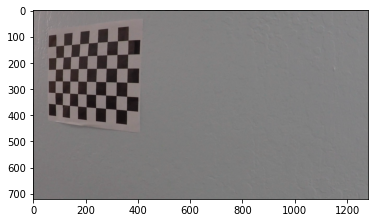

In [5]:
for img_path in images:
    img = cv2.imread(img_path)
    plt.imshow(img)
    calib_img.append(img)
    plt.show() 

In [6]:
#making sure all calibration images are read.
len(calib_img)

20

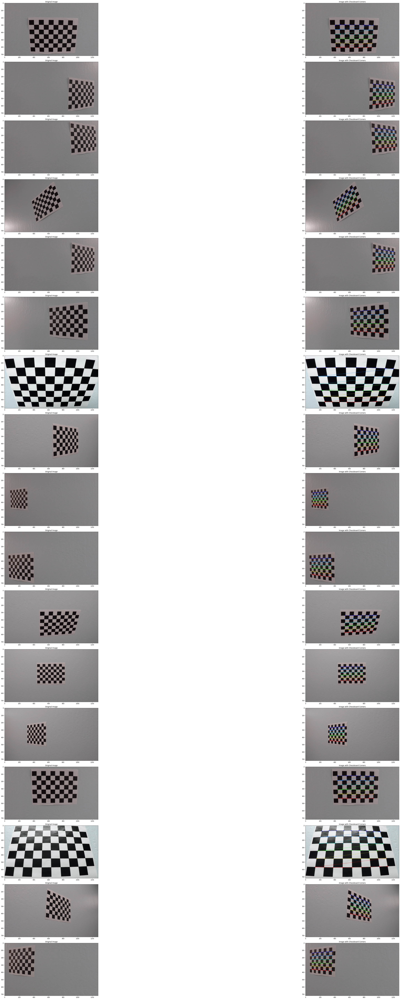

In [7]:
#distortion processing-1 
#draw chess board corners.
f,axes = plt.subplots(17,2,figsize=(100,100)) 
numtrue =0
pl_ind=0
os.chdir('output_images/Draw_cardboard')
for img in calib_img:
    gray = cv2.cvtColor(img,cv2.COLOR_BGR2GRAY)
    ret,corners  =cv2.findChessboardCorners(gray,(9,6),None)
    
    if ret ==True:
        numtrue = numtrue+1
        
        axes[pl_ind,0].set_title('Original Image')
        axes[pl_ind,0].imshow(img)
        img = cv2.drawChessboardCorners(img,(9,6),corners,ret)
        objpoints.append(objp)
        imgpoints.append(corners)
        axes[pl_ind,1].set_title('Image with Chessboard Corners')
        axes[pl_ind,1].imshow(img)
        #cv2.imwrite('draw{}.jpg'.format(numtrue),img)
        pl_ind = pl_ind+1
        plt.tight_layout()
   

In [8]:
#number of successfulc chessboard corner detections
print(numtrue)

17


In [9]:
#calibrate camera
shape=calib_img[0][:,:,0].shape[::-1]
print(shape)
ret, mtx, dist, rvecs, tvecs = cv2.calibrateCamera(objpoints,imgpoints,shape, None, None)
    


(1280, 720)


In [10]:
#define destort function
def undistort(img,mtx,dist):
    return cv2.undistort(img,mtx,dist,None,mtx)

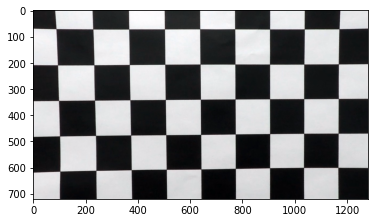

In [11]:
#test if calibration function works
test_img = undistort(calib_img[11],mtx,dist)
plt.imshow(test_img)
os.chdir('../Undistort_images')
#cv2.imwrite('test.jpg',test_img)

/home/shyam/Desktop/SDCND/CarND-Advanced-Lane-Lines


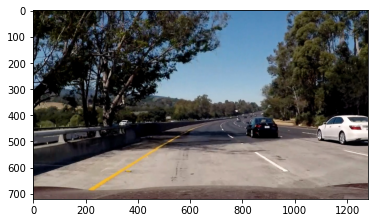

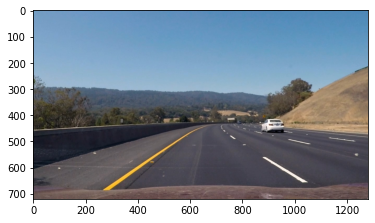

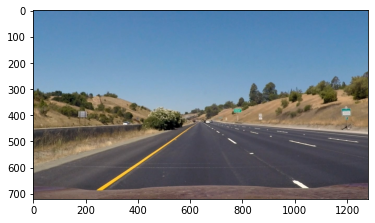

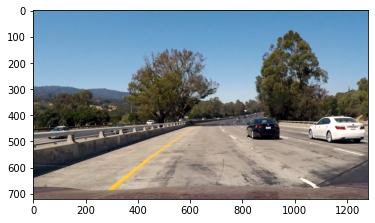

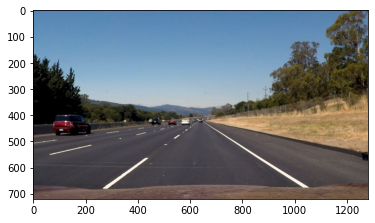

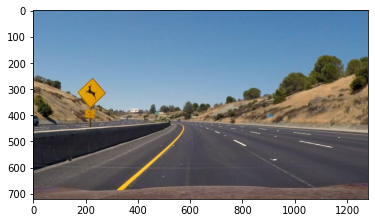

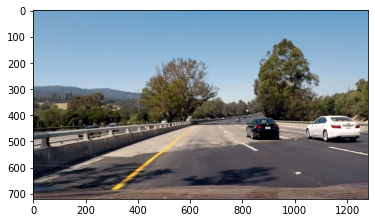

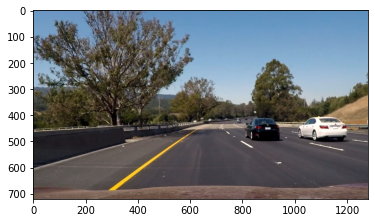

In [12]:
#load test images
os.chdir('../..')
print(os.getcwd())
rdimpa = glob.glob('test_images/*')
test=[]
for img_path in rdimpa:
    img = mpimg.imread(img_path)
    plt.imshow(img)
    test.append(img)
    plt.show()

In [13]:
#process test image for distortion
os.chdir('output_images/Undistort_images')
count=1

for img in test:
    img = undistort(img,mtx,dist)
    #cv2.imwrite('undist{}.jpg'.format(count),cv2.cvtColor(img,cv2.COLOR_BGR2RGB))
    
    count = count+1

In [14]:
#Threshold the images
#Following combinations we are going to use S channel of HLS
#RG channel
#sobel x
def sobel_x(img,mintr,maxtr):
    img=cv2.cvtColor(img,cv2.COLOR_RGB2GRAY)
    sobx=cv2.Sobel(img,cv2.CV_64F,1,0)
    absso = np.absolute(sobx)
    scale = np.uint8((255*absso)/np.max(absso))
    thresh = np.zeros_like(scale)
    thresh[(scale <= maxtr) & (scale>=mintr)] =1
    return thresh

def sobel_y(img,mintr,maxtr):
    img=cv2.cvtColor(img,cv2.COLOR_RGB2GRAY)
    sobx=cv2.Sobel(img,cv2.CV_64F,0,1)
    absso = np.absolute(sobx);
    scale = np.uint8((255*absso)/np.max(absso))
    thresh = np.zeros_like(scale)
    thresh[(scale <= maxtr) & (scale>=mintr)] =1
    return thresh

def sobel_dir(img,mintr,maxtr):
    img=cv2.cvtColor(img,cv2.COLOR_RGB2GRAY)
    soby=cv2.Sobel(img,cv2.CV_64F,0,1)
    sobx=cv2.Sobel(img,cv2.CV_64F,1,0)
    abssox = np.absolute(sobx)
    abssoy = np.absolute(soby)
    direc = np.arctan2(abssoy,abssox)
    thresh = np.zeros_like(abssox)
    thresh[(direc <= maxtr) & (direc>=mintr)] =1
    return thresh

def HLS_S(img,mintr,maxtr):
    img=cv2.cvtColor(img,cv2.COLOR_RGB2HLS)
    img=img[:,:,2]
    thresh = np.zeros_like(img)
    thresh[(img<=maxtr) & (img>=mintr)] = 1
    return thresh


def RG(img,minr,maxr,ming,maxg):
    img1=img[:,:,0]
    img2=img[:,:,1]
    thresh = np.zeros_like(img1)
    thresh2 = np.zeros_like(img2)
    thresh[(img1<=maxr) & (img1>=minr)] = 1
    thresh2[(img2<=maxg) & (img2>=ming)] = 1
    combthresh = np.zeros_like(img1)
    combthresh[(thresh==1)|(thresh2==1)]=1
    return thresh


def mag_binary(img,maxr,minr):
    gray = cv2.cvtColor(img, cv2.COLOR_RGB2GRAY)
    sobelx = cv2.Sobel(gray, cv2.CV_64F, 1, 0, ksize=3)
    sobely = cv2.Sobel(gray, cv2.CV_64F, 0, 1, ksize=3)
    gradmag = np.sqrt(sobelx**2 + sobely**2)
    scale_factor = np.max(gradmag)/255 
    gradmag = (gradmag/scale_factor).astype(np.uint8) 
    binary_output = np.zeros_like(gradmag)
    binary_output[(gradmag >= minr) & (gradmag <= maxr)] = 1
    return binary_output

In [15]:
os.getcwd()
os.chdir('../Undistort_images')
dist_path = glob.glob('undist*')

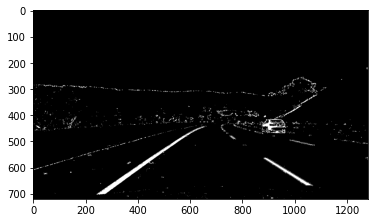

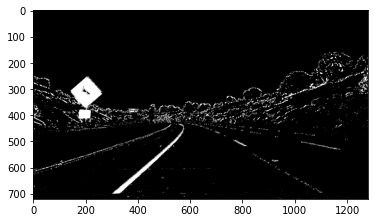

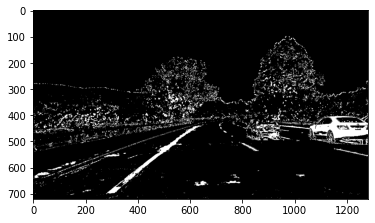

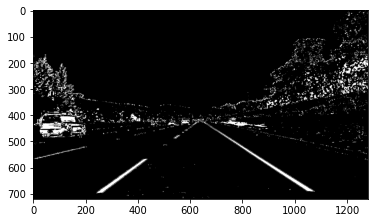

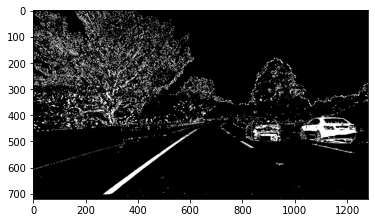

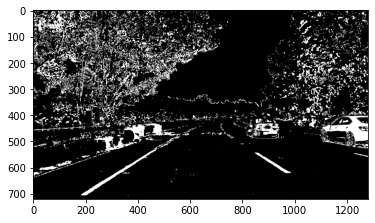

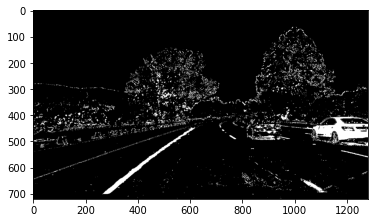

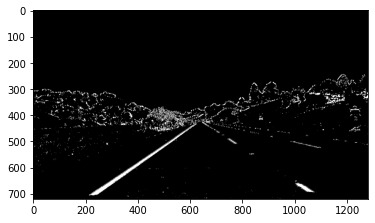

In [16]:
count=1

for img_path in dist_path:
    img = plt.imread(img_path)
    imgrg = RG(img,220,255,100,255)
    imgs = HLS_S(img,150,255)
    imgx = sobel_x(img,20,100)
    imgy = sobel_y(img,20,100)
    imgdir = sobel_dir(img,0.0,0.7)
    imgmag = mag_binary(img,30,100)
    imgfi = np.zeros_like(imgrg)
    imgfi[(imgx==1)&(imgy==1)|(imgdir==1)&(imgmag==1)]=1
    imgfi2 = np.zeros_like(imgrg)
    imgfi2[((imgs==1)|(imgrg==1))|(imgfi==1)]=1
    
    #cv2.imwrite('../Thresholding/thresh{}.jpg'.format(count),imgfi2*255)
    count=count+1
    plt.imshow(imgfi2,cmap='gray')
    
    plt.show()

In [17]:
#Time to warp the images in top down view
def topview(img):
    src = np.array([[568,470],[260,680],[717,470],[1043,680]],np.float32)
    dst = np.array([[200,0],[200,680],[1000,0],[1000,680]],np.float32)
    M = cv2.getPerspectiveTransform(src, dst)                            
    warped = cv2.warpPerspective(img, M, (img.shape[1],img.shape[0]))
    return warped


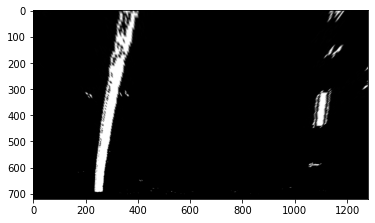

In [18]:
os.getcwd()
os.chdir('../Thresholding')
#Time to test if we can change persepective
img = mpimg.imread('thresh5.jpg')
plt.imshow(topview(img),cmap='gray')

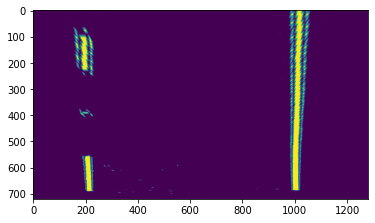

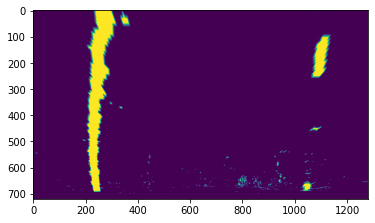

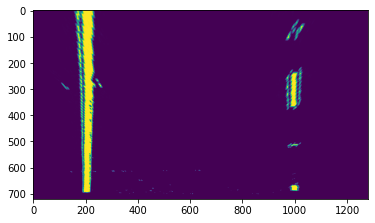

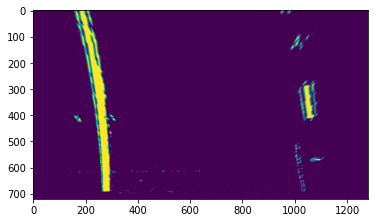

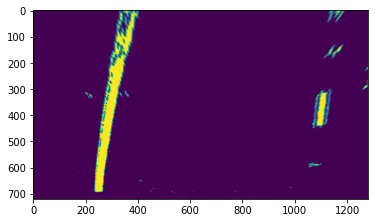

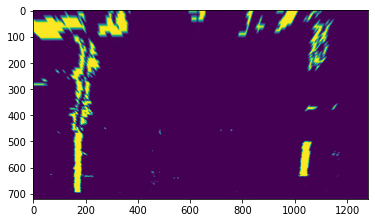

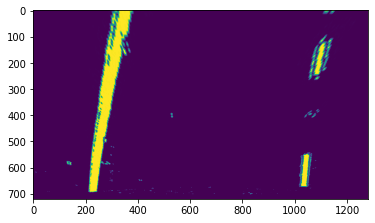

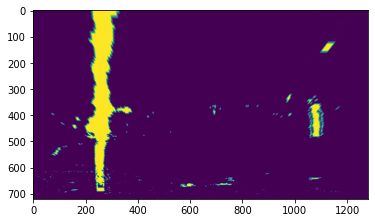

In [19]:
#lets record the output for all images!
dist_path = glob.glob('thresh*')
count=1
os.getcwd()
for img_path in dist_path:
    img = plt.imread(img_path)
    img = topview(img)
    #cv2.imwrite('../warped/topview{}.jpg'.format(count),cv2.cvtColor(img,cv2.COLOR_BGR2RGB))
    count=count+1
    plt.imshow(img)
    plt.show()

In [27]:
#lets visualize histogram
def hist(img):
    histo = np.sum(img[img.shape[0]//2:,:],axis=0)
    plt.plot(histo)


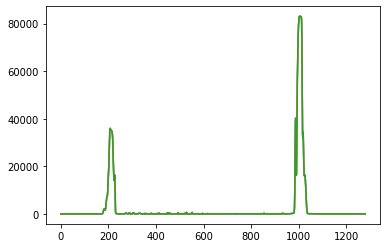

In [28]:
os.chdir('../warped')
img = mpimg.imread('topview1.jpg')
hist(img)
plt.show()
#correctly findsout image starts at 200 to 1000

In [ ]:
def sliding_window_poly(img):
    